In [ ]:
# !git clone https://github.com/isl-org/MiDaS.git

In [ ]:
# !pip install timm

In [ ]:
# !python /content/MiDaS/run.py --model_type dpt_beit_large_512 --input_path /content/MiDaS/input --output_path /content/MiDaS/output

In [ ]:
!pip install open3d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 420.5/420.5 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 62.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.3/138.3 kB 13.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 48.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 50.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 33.0 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.4
    Uninstalling widgetsnbextension-3.6.4:
      Successfully uninstalled widgetsnbextension-3.6.4
  Attempting uninstall: werkzeug
    Found existing installation: Werkzeug 2.3.6
    Uninstalling Werkzeug-2.3.6:
      Successfully uninstalled Werkzeug-2.3.6

In [ ]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 61.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 24.7 MB/s eta 0:00:00


# 1st model

704 448


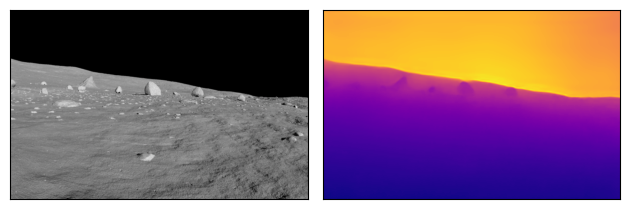

In [ ]:
import matplotlib
from matplotlib import pyplot as plt
from PIL import Image
import torch
from transformers import GLPNImageProcessor, GLPNForDepthEstimation


feature_extractor = GLPNImageProcessor.from_pretrained("vinvino02/glpn-nyu")
model = GLPNForDepthEstimation.from_pretrained("vinvino02/glpn-nyu")

# load and resize the input image
image = Image.open("/content/render0013.png")
new_height = 480 if image.height > 480 else image.height
new_height -= (new_height % 32)
new_width = int(new_height * image.width / image.height)
diff = new_width % 32
new_width = new_width - diff if diff < 16 else new_width + 32 - diff
new_size = (new_width, new_height)
image = image.resize(new_size)
# image.save("m2_proc.jpg")

# prepare image for the model
inputs = feature_extractor(images=image, return_tensors="pt")

# get the prediction from the model
with torch.no_grad():
    outputs = model(**inputs)
    predicted_depth = outputs.predicted_depth

# remove borders
pad = 16
output = predicted_depth.squeeze().cpu().numpy() * 1000.0
output = output[pad:-pad, pad:-pad]
image = image.crop((pad, pad, image.width - pad, image.height - pad))
image.save("m2_proc.jpg")

width, height = image.size
print(width,height)
# visualize the prediction
fig, ax = plt.subplots(1, 2)
ax[0].imshow(image)
ax[0].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
ax[1].imshow(output, cmap='plasma')
ax[1].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
plt.tight_layout()
# plt.pause(5)

In [ ]:
import numpy as np
import open3d as o3d
from PIL import Image


depth_image = (output * 255 / np.max(output)).astype('uint8')
image = np.array(image)
# create rgbd image
depth_o3d = o3d.geometry.Image(depth_image)
image_o3d = o3d.geometry.Image(image)
rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(image_o3d, depth_o3d, convert_rgb_to_intensity=False)

d_o3d = np.asarray(depth_o3d)
print(d_o3d)
# camera settings
print(width, height)
camera_intrinsic = o3d.camera.PinholeCameraIntrinsic()
camera_intrinsic.set_intrinsics(width, height, 500, 500, width/2, height/2)

# create point cloud
pcd = o3d.geometry.PointCloud.create_from_rgbd_image(rgbd_image, camera_intrinsic)

cl, ind = pcd.remove_statistical_outlier(nb_neighbors=20, std_ratio=20.0)
pcd = pcd.select_by_index(ind)

# estimate normals
pcd.estimate_normals()
pcd.orient_normals_to_align_with_direction()

#Rotate point cloud
rotation = pcd.get_rotation_matrix_from_xyz((3*np.pi/2, 0,0))
pcd.rotate(rotation, center=(0, 0, 0))


[[216 215 215 ... 197 197 198]
 [216 215 215 ... 198 198 198]
 [216 216 215 ... 198 199 199]
 ...
 [ 58  58  58 ...  64  64  63]
 [ 58  58  58 ...  64  63  63]
 [ 58  58  58 ...  63  63  63]]
704 448


PointCloud with 315392 points.

In [ ]:

# surface reconstruction
# mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd, depth=10, n_threads=1)[0]
with o3d.utility.VerbosityContextManager(
        o3d.utility.VerbosityLevel.Debug) as cm:
    mesh, densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(
        pcd, depth=9)
print(mesh)
vertices_to_remove = densities < np.quantile(densities, 0.03)
mesh.remove_vertices_by_mask(vertices_to_remove)

# rotate the mesh
rotation = mesh.get_rotation_matrix_from_xyz((np.pi, 0, 0))
mesh.rotate(rotation, center=(0, 0, 0))

# save the mesh
o3d.io.write_triangle_mesh(f'./mars_rocks.obj', mesh)

# visualize the mesh
# o3d.visualization.draw_geometries([mesh], mesh_show_back_face=True)

[Open3D DEBUG] Input Points / Samples: 272384 / 136622
[Open3D DEBUG] #   Got kernel density: 0.052713871002197266 (s), 1435.92578125 (MB) / 1435.92578125 (MB) / 1562 (MB)
[Open3D DEBUG] #     Got normal field: 0.45461392402648926 (s), 1457.37890625 (MB) / 1457.37890625 (MB) / 1562 (MB)
[Open3D DEBUG] Point weight / Estimated Area: 3.626583e-06 / 9.878231e-01
[Open3D DEBUG] #       Finalized tree: 0.46090197563171387 (s), 1461.24609375 (MB) / 1461.24609375 (MB) / 1562 (MB)
[Open3D DEBUG] #  Set FEM constraints: 2.089299201965332 (s), 1461.24609375 (MB) / 1461.24609375 (MB) / 1562 (MB)
[Open3D DEBUG] #Set point constraints: 0.1325678825378418 (s), 1461.24609375 (MB) / 1461.24609375 (MB) / 1562 (MB)
[Open3D DEBUG] Leaf Nodes / Active Nodes / Ghost Nodes: 1165039 / 1314944 / 16529
[Open3D DEBUG] Memory Usage: 1461.246 MB
[Open3D DEBUG] # Linear system solved: 1.5637459754943848 (s), 1461.24609375 (MB) / 1461.24609375 (MB) / 1562 (MB)
[Open3D DEBUG] Got average: 0.06870794296264648 (s), 14

True

In [ ]:

# o3d.io.write_image("depth.png",rgbd_image)

6.403921451419592e-08 1.3619607593864201e-07 4.5098038390278814e-07
6.181176472455263e-08 2.3244705889374019e-07 4.352941177785397e-07
9.08470579306595e-08 2.0731764502124863e-07 3.882352903019637e-07
9.268235106719658e-08 1.1644705646904185e-07 3.9607842336408793e-07


In [ ]:
# pcd1 = o3d.io.read_point_cloud("output3.ply", format='ply')

In [ ]:
# p1_load = np.asarray(pcd.points)
# p2_load = np.asarray(pcd1.points)

# p3_load = np.concatenate((p1_load,p2_load), axis=0)

In [ ]:
points = np.asarray(pcd.points)
print(points)

[[-0.00054362  0.00089412  0.00040056]
 [-0.00054184  0.00089412  0.00040056]
 [-0.00054005  0.00089412  0.00040056]
 ...
 [ 0.0002408   0.0004     -0.0001784 ]
 [ 0.0002416   0.0004     -0.0001784 ]
 [ 0.0002424   0.0004     -0.0001784 ]]


In [ ]:
o3d.io.write_point_cloud("mars_rocks_test_path.ply", pcd, write_ascii=False, compressed=False, print_progress=False)

True

In [ ]:
# save the mesh
# o3d.io.write_triangle_mesh(f'./panaroma_combined.obj', mesh)

True

In [ ]:
import plotly.graph_objects as go


triangles = np.asarray(mesh.triangles)
vertices = np.asarray(mesh.vertices)
colors = None
if mesh.has_triangle_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(mesh.triangle_normals) * 0.5
    colors = tuple(map(tuple, colors))
else:
    colors = (1.0, 0.0, 0.0)

In [ ]:
import plotly.graph_objects as go
fig = go.Figure(
    data=[
        go.Mesh3d(
            x=vertices[:,0],
            y=vertices[:,1],
            z=vertices[:,2],
            i=triangles[:,0],
            j=triangles[:,1],
            k=triangles[:,2],
            facecolor=colors,
            opacity=1)
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )
)
fig.show(renderer="colab")

In [ ]:
o3d.visualization.draw_geometries([mesh], mesh_show_back_face=True)

[Open3D WARNING] GLFW Error: X11: The DISPLAY environment variable is missing
[Open3D WARNING] Failed to initialize GLFW
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.




```
# This is formatted as code
```

# Occupancy Grid Generation

In [ ]:
image = Image.open("D:\path_test_bb.jpg")
new_height = 480 if image.height > 480 else image.height
new_height -= (new_height % 32)
new_width = int(new_height * image.width / image.height)
diff = new_width % 32
new_width = new_width - diff if diff < 16 else new_width + 32 - diff
new_size = (new_width, new_height)
image = image.resize(new_size)

In [ ]:
import numpy as np
# save depth image
nump = np.asarray(rgbd_image.depth)
nump = nump.swapaxes(0,1)
cy = width/2
cx = height/2
fx = 500
fy = 500
# print(nump)

# test = [[387,291,405,301],
#       [35,342,77,367],
#        [0,421,22,444],
#         [5,395,74,423],
#          [375,375,490,419],
#           [345,434,427,447],
#         [511,323,535,338],
#         [551,399,585,431]]

# test = [[205,172,267,246],[243,251,298,291],[279,240,332,367],[455,248,546,288],[300,93,379,129]]

test = [[1,160,16,194],[163,156,206,185],[249,180,267,200],[315,169,359,206],[423,181,461,207]]
#SUCCESS
# test = [[375,375],[491,375],[491,421],[371,421]]
# test1 =[[5,395],[74,395],[5,420],[74,420]] #success
print(nump.shape)
# test = [[375,375],[375,491],[421,491],[421,371]]
for i in test:
 z1 = nump[i[0]][i[1]]
 x1 = (i[0] - cy) * z1 / fy
 y1 = (i[1] - cx) * z1 / cy
 z2 = nump[i[2]][i[3]]
 x2 = (i[2] - cy) * z2 / fy
 y2 = (i[3] - cx) * z2 / cy
 print("[",x1,",",y1,",",z1,",",x2,",",y2,",",z2,"]",",")

#XZY

(704, 448)
[ -0.0003633882453432307 , -9.411764966154641e-05 , 0.0005176471 , -0.0003004235252737999 , -3.810160375327211e-05 , 0.00044705882 ] ,
[ -0.00022087060217745603 , -0.00011287879500411113 , 0.00058431376 , -0.0001534431402105838 , -5.822192625518338e-05 , 0.0005254902 ] ,
[ -0.0001147137361112982 , -6.960784958209842e-05 , 0.0005568628 , -8.266666700365021e-05 , -3.315508034905758e-05 , 0.0004862745 ] ,
[ -4.9043136881664394e-05 , -0.00010355392078054138 , 0.0006627451 , 7.192157092504203e-06 , -2.627005431515334e-05 , 0.0005137255 ] ,
[ 9.243921586312353e-05 , -7.952317305766469e-05 , 0.0006509804 , 0.00011883137247059494 , -2.6325757558383472e-05 , 0.00054509804 ] ,


In [ ]:
import copy
from PIL import Image
import open3d as o3d
import numpy as np

source = o3d.io.read_point_cloud("D:\plys\mars_rocks_test_path.ply")
rotation = source.get_rotation_matrix_from_xyz((3*np.pi/2, 0,0))
source.rotate(rotation, center=(0, 0, 0))
# voxel_grid = o3d.geometry.VoxelGrid.create_from_point_cloud(source,voxel_size=0.0000001)
print(source)
pts = np.asarray(source.points)
print(pts.min(axis=0),pts.max(axis=0))
# print(pts)
# output = voxel_grid.check_if_included(o3d.utility.Vector3dVector(queries))

bb_coord = [[ -0.0002697490227874368 , -0.0006392157 , -0.00017412550118751824 , -0.00058431376 ] ,
[ -0.0002021725617814809 , -0.00058431376 , -0.00014160000672563912 , -0.0006 ] ,
[ -0.000165474517038092 , -0.0006039216 , -8.894117781892419e-05 , -0.0005294118 ] ,
[ 4.680000222288072e-05 , -0.0006 , 0.00014070588280446828 , -0.0005411765 ] ,
[ -0.0001692235334776342 , -0.0007294118 , -5.194510042201728e-05 , -0.0007019608 ]]

# bb_coord = [[ -0.00038826668076217174 , -0.0008156863 , -0.00012324705894570798 , -0.0007607843 ] ,
# [ 0.0002539921710267663 , -0.0006901961 , 0.0003745254969689995 , -0.0007372549 ]]

bb_coord_new = []
clr = np.asarray(source.colors)
i = 0
for point in bb_coord:
    X1 = min(point[0],point[2])
    X2 = max(point[0],point[2])
    Y1 = min(point[1],point[3])
    Y2 = max(point[1],point[3])
    bb_coord_new.append([X1,X2,Y1,Y2])
print(bb_coord_new)
for point in pts:
    for bb in bb_coord_new:
        if (bb[0] < point[0] and point[0] < bb[1]) and (bb[2] < point[2] and point[2] < bb[3]):
            source.colors[i] = [1,0,0]
        # print(point)
    # if Y1 < point[1] and point[1] < Y2:#and Y1 < point[2] and point[2] < Y2:
    #     source.colors[i] = [1,0,0]
    i += 1


# final_pointcloud = o3d.geometry.PointCloud()
# final_pointcloud.points = o3d.utility.Vector3dVector(final_pointcloud_array)
o3d.visualization.draw_geometries([source])
o3d.io.write_point_cloud("D:\moon_rocks_bb.ply",source)


[[0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.         0.         0.        ]
 ...
 [0.52156863 0.48627451 0.4       ]
 [0.49019608 0.47843137 0.4       ]
 [0.48235294 0.46666667 0.38431373]]


In [ ]:
source = o3d.io.read_point_cloud("D:\moon_rocks_bb.ply")
rotation = source.get_rotation_matrix_from_xyz((np.pi/2, 0,0))
source.rotate(rotation, center=(0, 0, 0))
pts = np.asarray(source.points)
clr = np.asarray(source.colors)
print("Range of Points:",pts.min(axis=0),pts.max(axis=0))


# Dynamic resolution depending on the range of the point cloud
res =  (int((pts.max(axis=0)[0] - pts.min(axis=0)[0])*1000000/4+1),int((pts.max(axis=0)[2] - pts.min(axis=0)[2])*1000000/4+1),3)
arr = np.zeros(res, dtype = np.uint8)
#Initialize as gray
arr.fill(128)
print(res)
x_min = pts.min(axis=0)[0]
Y_min = pts.min(axis=0)[2]
i = 0
for pt in pts:
    comparison = source.colors[i] == [1,0,0]
    equal_arrays = comparison.all()
    x = int((pt[0] - x_min)*1000000/4)
    y = int((pt[2]- Y_min)*1000000/4)
    # print (source.colors[i])
    if equal_arrays:
      arr[x,y] = [0,0,0]
    else:
      arr[x,y] = [255,255,255]
    i += 1
# for pt in pts:
img = Image.fromarray(arr)
img.save("D:/plot_pt_2.jpg")

# A-Star

In [ ]:
pip install pathfinding

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pathfinding.core.diagonal_movement import DiagonalMovement
from pathfinding.core.grid import Grid
from pathfinding.finder.a_star import AStarFinder

In [ ]:
occupancy_grid = np.zeros(res[:2],dtype = np.uint8)
occupancy_grid.shape

for i in range(0,res[0]):
  for j in range(0,res[1]):
    if arr[i][j][0] == 255:
      occupancy_grid[i][j] = 1
    elif arr[i][j][0] ==128:
      occupancy_grid[i][j] = 10

grid = Grid(matrix=occupancy_grid)

In [ ]:
start = grid.node(85, 75)
end = grid.node(10, 200)

In [ ]:
finder = AStarFinder(diagonal_movement=DiagonalMovement.always)
path, runs = finder.find_path(start, end, grid)

In [ ]:
print(path)

[(85, 75), (84, 76), (83, 77), (82, 78), (81, 79), (81, 80), (80, 81), (79, 82), (79, 83), (79, 84), (79, 85), (79, 86), (78, 87), (78, 88), (77, 89), (77, 90), (76, 91), (75, 92), (74, 93), (74, 94), (73, 95), (73, 96), (73, 97), (73, 98), (73, 99), (73, 100), (73, 101), (72, 102), (71, 103), (70, 104), (70, 105), (70, 106), (69, 107), (68, 108), (67, 109), (66, 110), (65, 111), (64, 112), (63, 113), (62, 114), (61, 115), (60, 116), (59, 117), (58, 118), (57, 119), (56, 120), (55, 121), (54, 122), (53, 123), (52, 124), (51, 125), (50, 126), (49, 127), (48, 128), (48, 129), (47, 130), (46, 131), (45, 132), (44, 133), (43, 134), (42, 135), (41, 136), (40, 137), (39, 138), (38, 139), (37, 140), (36, 141), (35, 142), (34, 143), (33, 144), (32, 145), (31, 146), (30, 147), (29, 148), (29, 149), (28, 150), (27, 151), (26, 152), (25, 153), (24, 154), (23, 155), (22, 156), (21, 157), (20, 158), (19, 159), (18, 160), (17, 161), (16, 162), (16, 163), (16, 164), (16, 165), (16, 166), (16, 167), (

In [ ]:
for i in path:
  arr[i[1]][i[0]] = [0,0,255]

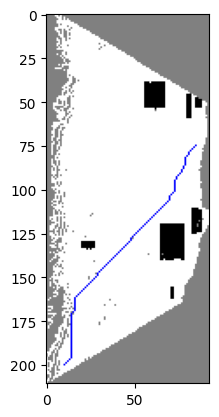

In [ ]:
imgplot = plt.imshow(arr)
img = Image.fromarray(arr)
img.save("top_view.png")